In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

In [ ]:
import warnings
warnings.filterwarnings("ignore")

In [ ]:
plt.rcParams['figure.figsize'] = (16,9)
plt.rcParams['figure.dpi'] = 300

In [ ]:
msc08s01 = pd.read_csv("./vmdf_msc08_s1.csv", index_col=0).rename(lambda x: x.replace("msc08_",''),
                                                                 axis="columns")
msc08s02 = pd.read_csv("./vmdf_msc08_s2.csv", index_col=0).rename(lambda x: x.replace("msc08_",''),
                                                                 axis="columns")

msc06s01 = pd.read_csv("./vmdf_msc06_s1.csv", index_col=0).rename(lambda x: x.replace("msc06_",''),
                                                                 axis="columns")
msc06s02 = pd.read_csv("./vmdf_msc06_s2.csv", index_col=0).rename(lambda x: x.replace("msc06_",''),
                                                                 axis="columns")

In [ ]:
s6cols = msc06s01.columns
s8cols = msc08s02.columns

In [ ]:
visual = ['p199_0',
          'p199_1',
          'p199_2',
          'p198_0',
          'p198_1',
          'p198_2',
          'p190_0',
          'p190_1',
          'p190_2']
mtl = ['p187_0',
       'p187_1',
       'p187_2',
       'p125_0',
       'p125_1',
       'p125_2',
       'p36_0',
       'p36_1',
       'p36_2']


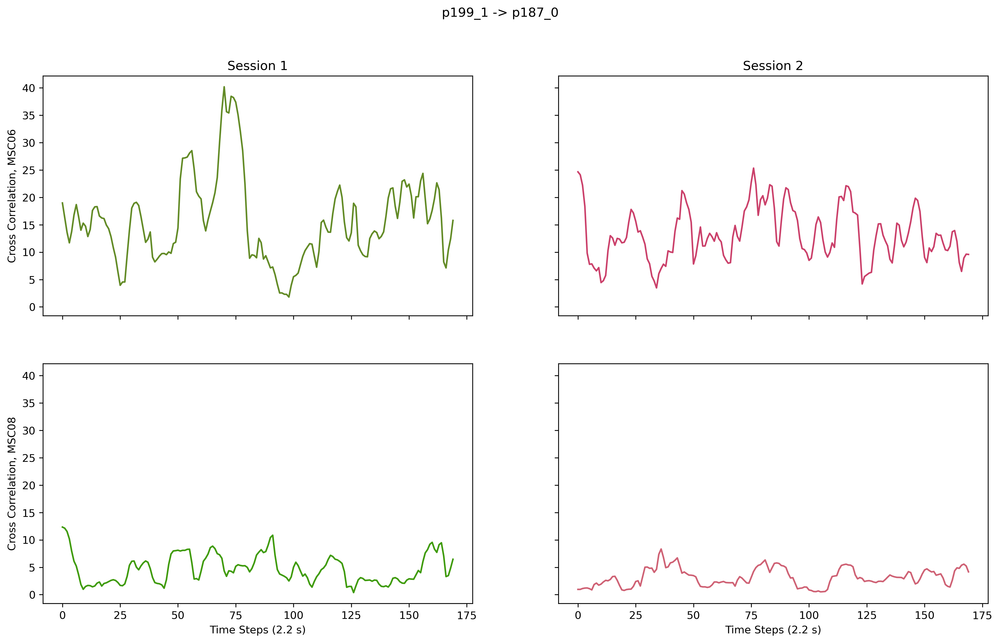

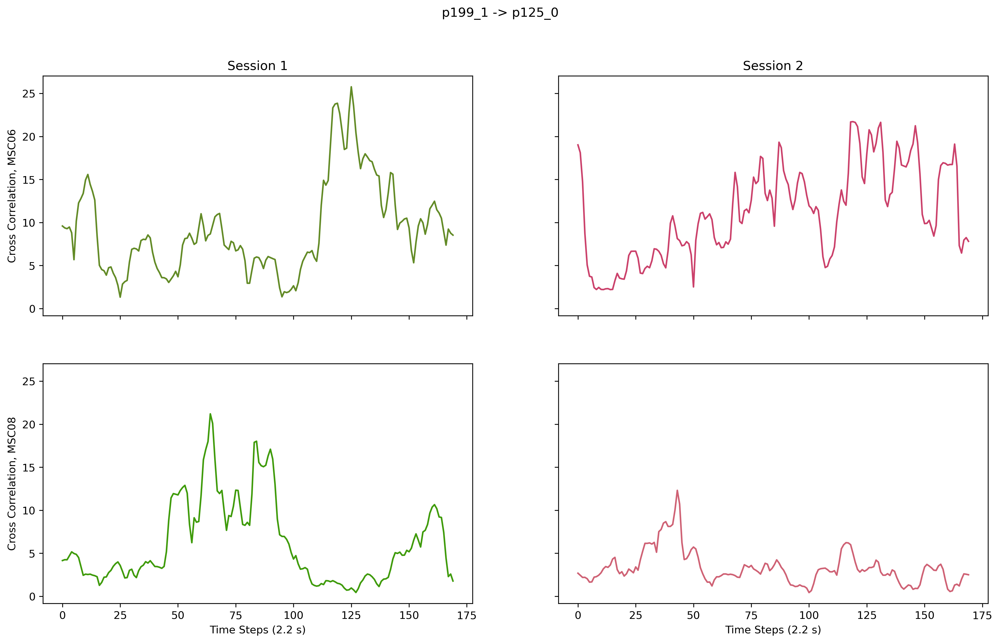

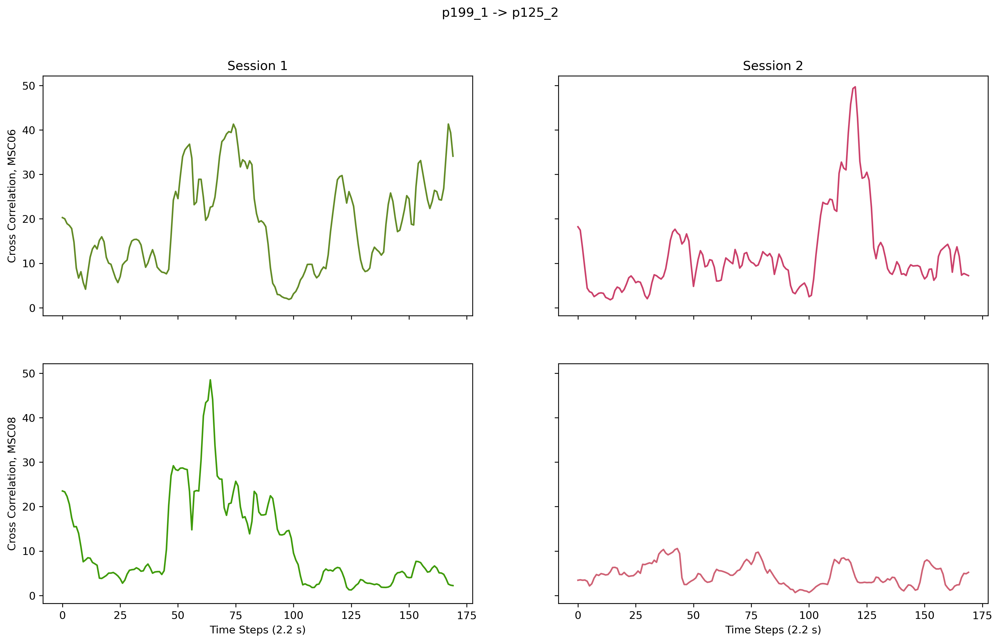

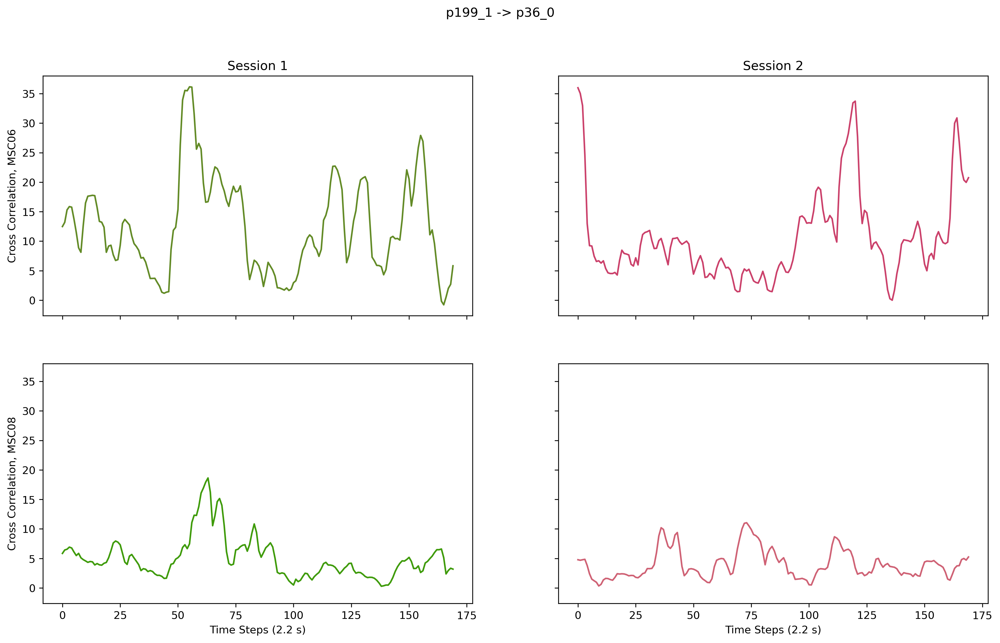

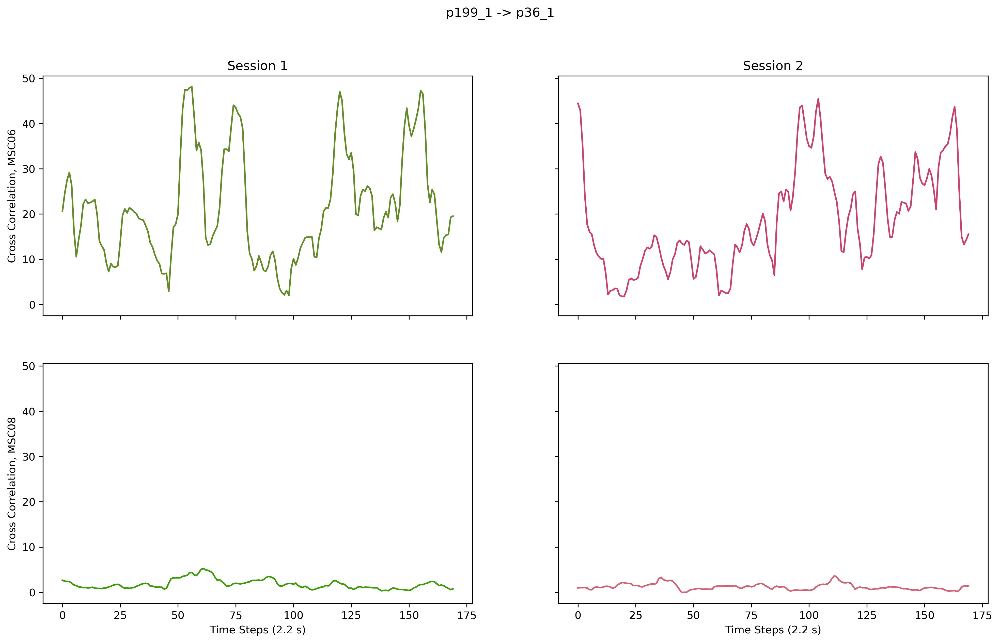

...

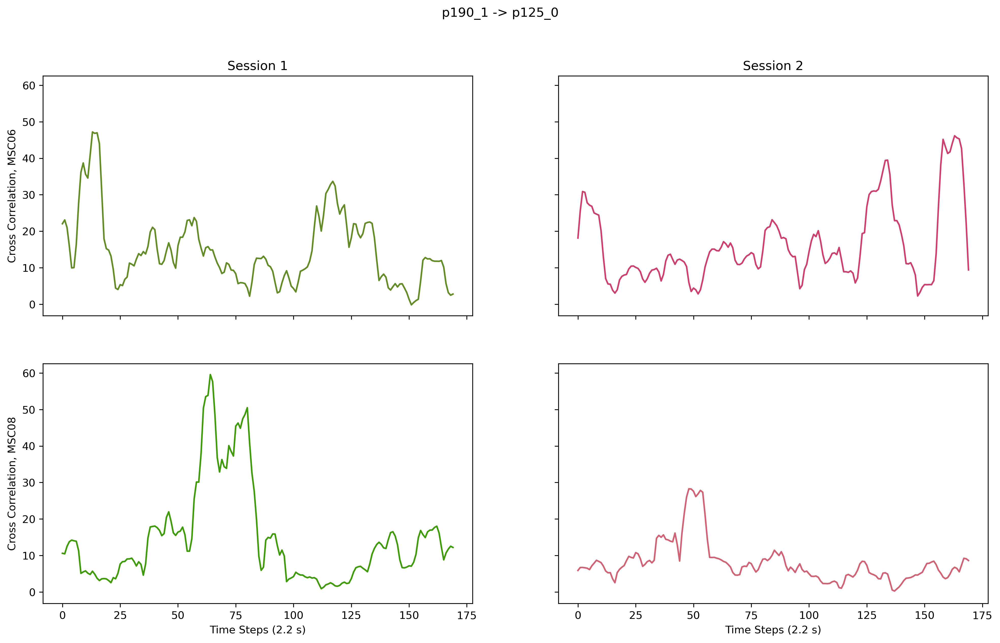

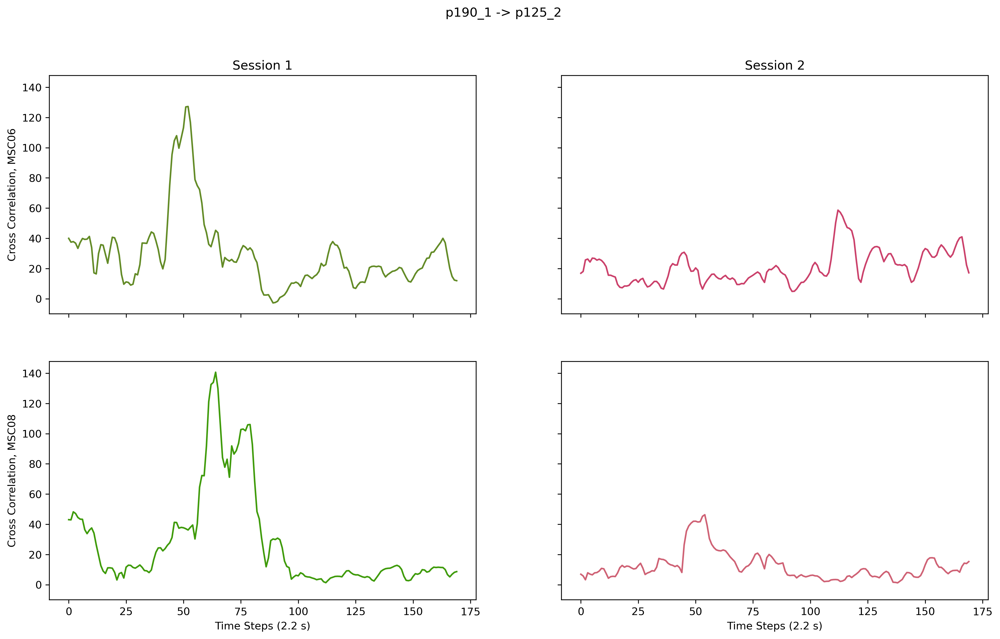

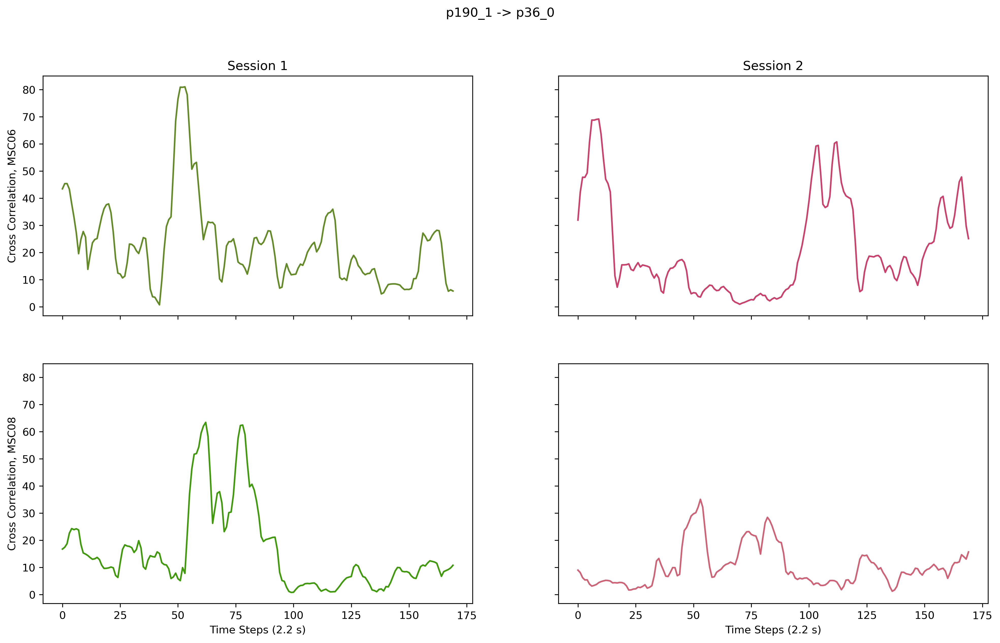

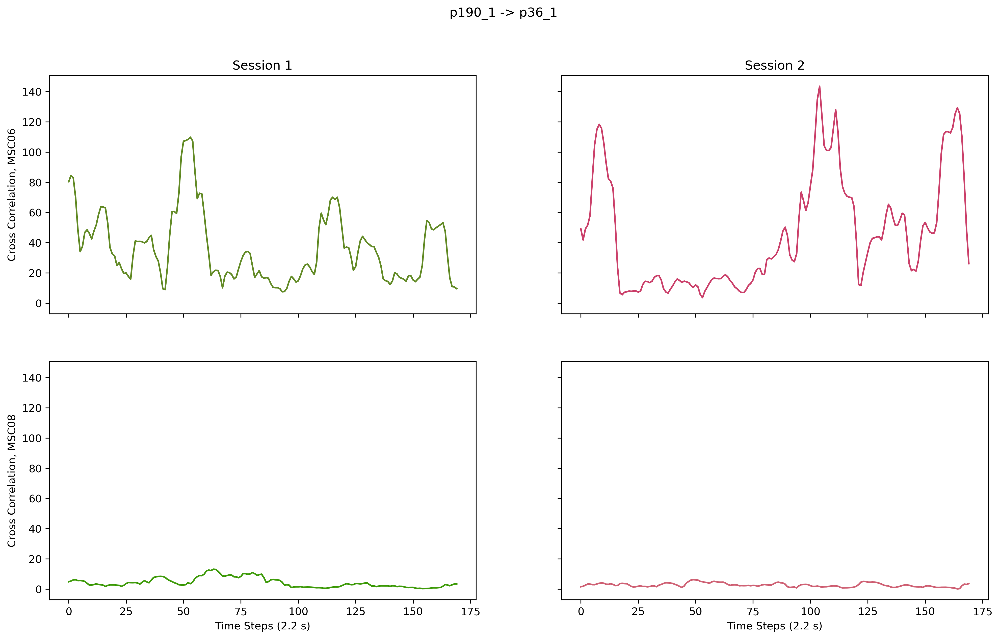

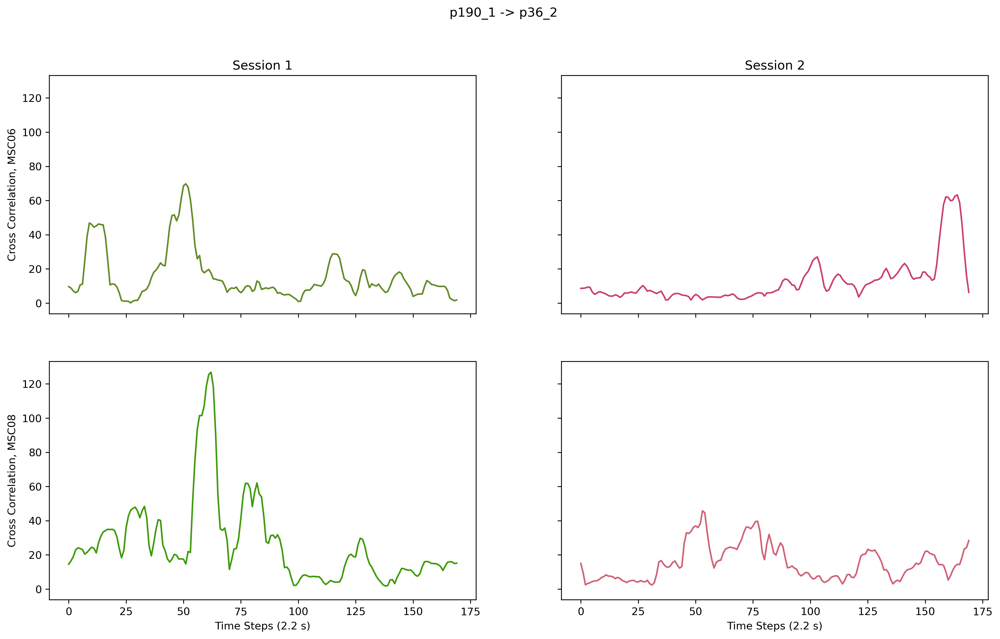

In [ ]:
for v in visual:
    for m in mtl:
        col = "_".join([v,m])
        if (col in s6cols) & (col in s8cols):
            fig, [[m6s1, m6s2], [m8s1, m8s2]] = plt.subplots(2,2, sharex=True, sharey=True)
            m6s1.plot(msc06s01[col], color="xkcd:mossy green")
            m6s2.plot(msc06s02[col], color="xkcd:dark pink")
            m6s1.set_ylabel("Cross Correlation, MSC06")
            m6s1.set_title("Session 1")
            m6s2.set_title("Session 2")
            m8s1.plot(msc08s01[col], color="xkcd:grass green")
            m8s2.plot(msc08s02[col], color="xkcd:rose")
            m8s1.set_ylabel("Cross Correlation, MSC08")
            m8s1.set_xlabel("Time Steps (2.2 s)")
            m8s2.set_xlabel("Time Steps (2.2 s)")
            fig.suptitle("%s -> %s" % (v, m))
            fig.savefig("./figs/subxsess_time_series_"+v+"_"+m+".jpg")
#         break
#     break


In [ ]:
for v in visual:
    for m in mtl:
        col = "_".join([v,m])
        if (col in s6cols) & (col in s8cols):
            plot_acf(msc06s01[col], alpha=0.01)
            plot_acf(msc06s02[col], alpha=0.01)
            plot_acf(msc08s01[col], alpha=0.01)
            plot_acf(msc08s02[col], alpha=0.01)

In [ ]:
from statsmodels.graphics.tsaplots import plot_acf

In [ ]:
m06mu = msc06s01.mean()

In [ ]:
m06std = msc06s01.std()

In [ ]:
wn06 = np.random.normal(m06mu.loc['p198_1_p36_1'], m06std.loc['p198_1_p36_1'], 170)

<Axes: ylabel='Density'>

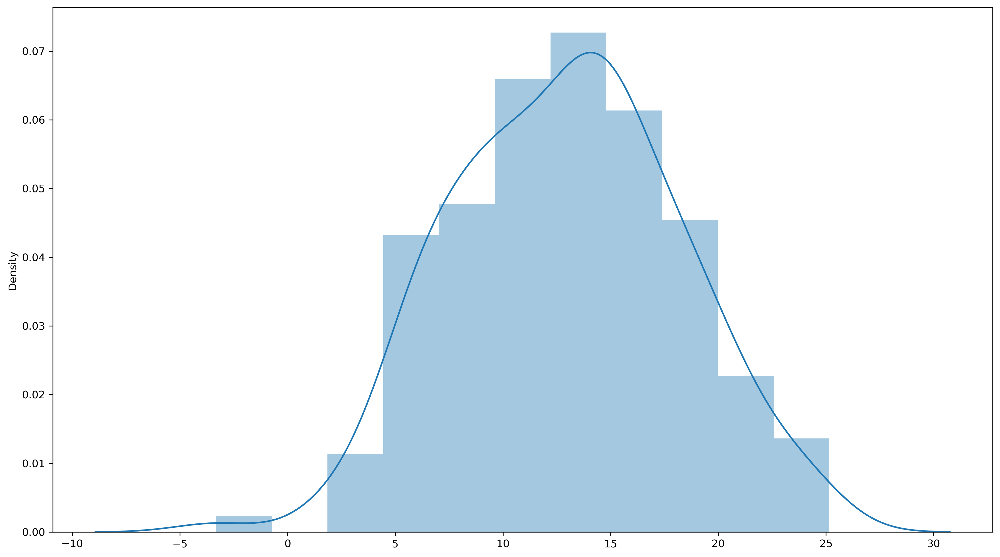

In [ ]:
sns.distplot(wn06)

<Axes: xlabel='p198_1_p36_1', ylabel='Density'>

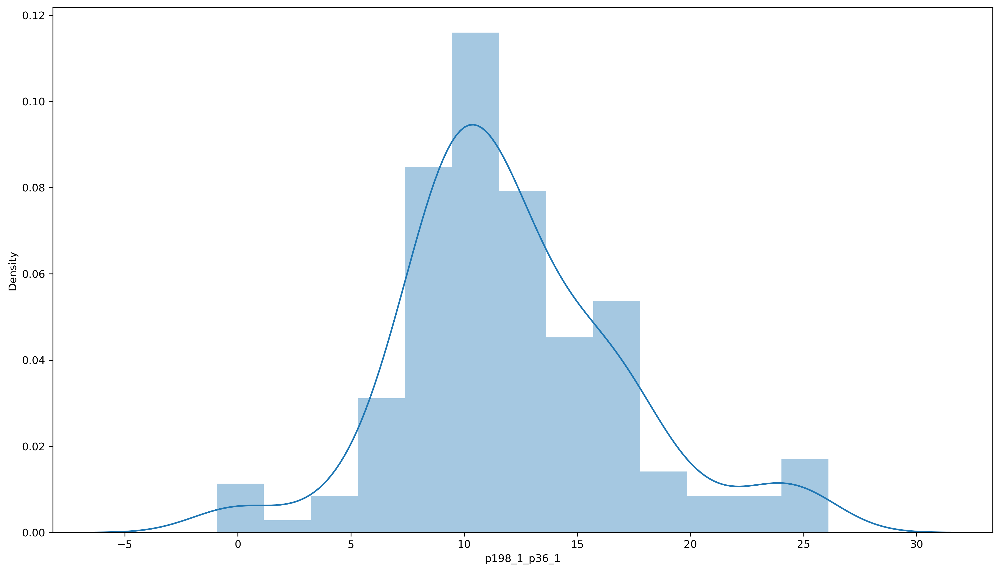

In [ ]:
sns.distplot(msc06s01['p198_1_p36_1'])

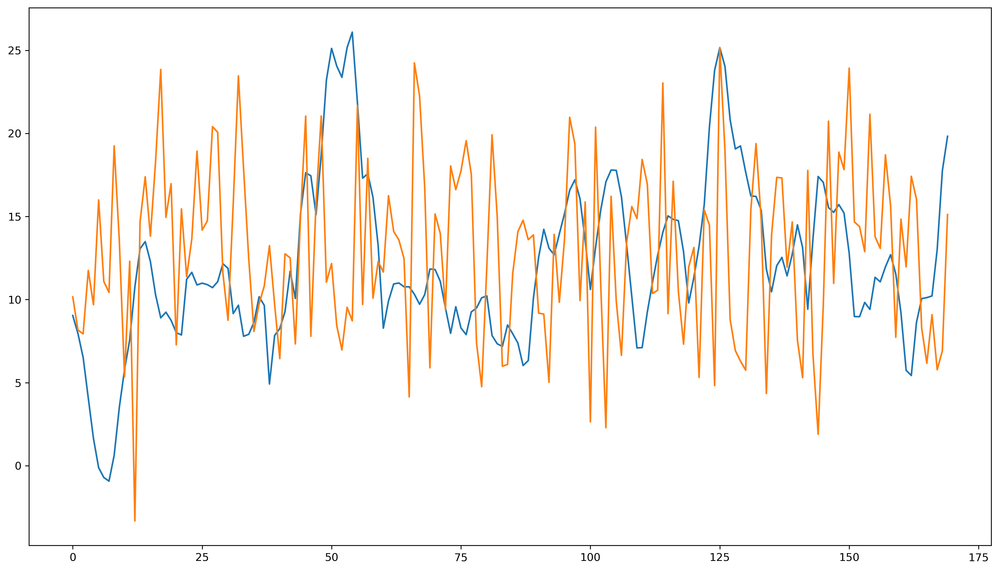

In [ ]:
fig, ax = plt.subplots(1,1)
ax.plot(msc06s01['p198_1_p36_1'])
ax.plot(wn06)

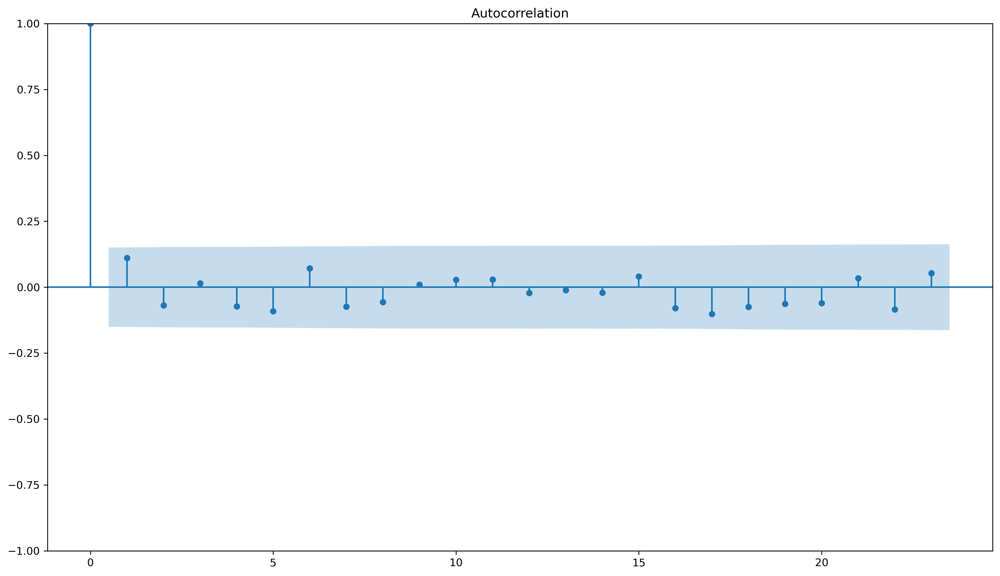

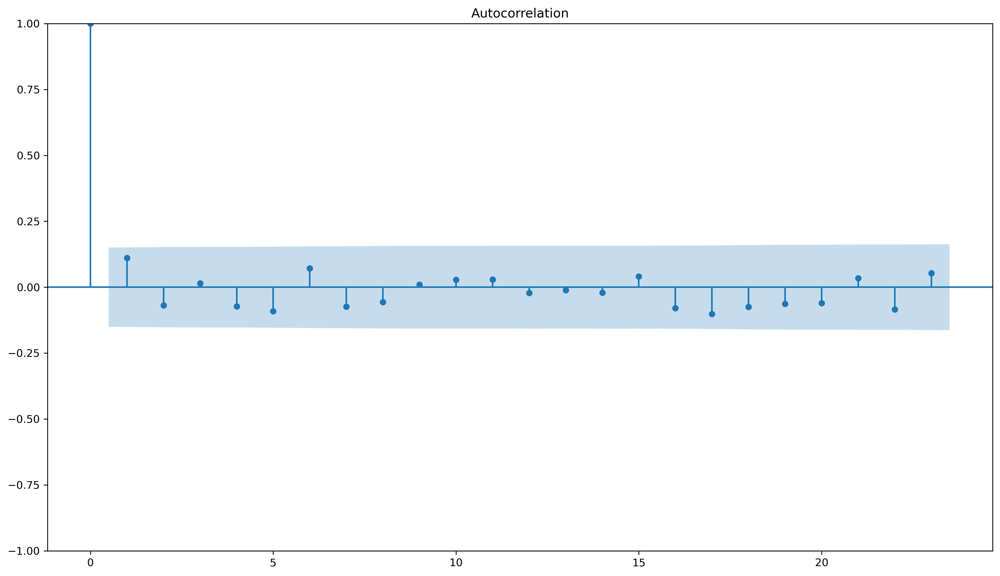

In [ ]:
plot_acf(wn06)

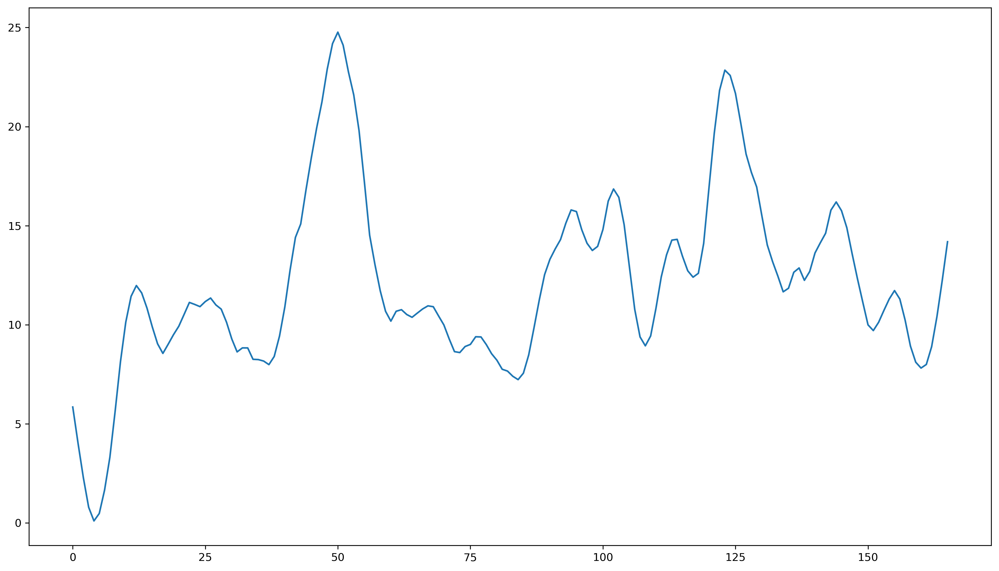

In [ ]:
plt.plot([msc06s01['p198_1_p36_1'].iloc[i:i+5].mean() for i in range(166)])